# ARC validation 2023 - Planet data

This notebook contains code and example runs to provide ARC estimates of a set of biophsycial variables over time, given a set of Planet [PS2.SD instrument](https://developers.planet.com/docs/apis/data/sensors/). The approach is generralisable to other sensors, but that is not done here. Details of the approach are given in Feng et al. (2024).

The notebook also provides codes to show how to obtain and use the ground measurements collected as a part of this project. The measurements are availabvle in the file [SF_2023_ground_measurements_LAI_Cab.geojson](./files/SF_2023_ground_measurements_LAI_Cab.geojson).

## requirements

First, we need to install required codes.

Note that the first time you run this notebook, you need to run the ee.Authenticate() command and log in with google Earth Engine.

In [1]:
!pip install xarray 

DEPRECATION: Loading egg at /Users/plewis/.local/lib/python3.11/site-packages/linmix-0.1.0.dev1-py3.11.egg is deprecated. pip 23.3 will enforce this behaviour change. A possible replacement is to use pip for package installation..


In [2]:
import ee
# ee.Authenticate()

In [3]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

from arc.assimilate_jax import assimilate
from arc.approximate_KNN_search import get_neighbours
from arc.arc_sample_generator import generate_arc_refs


First, we need to load the Planet data, which has been read and saved as a NetCDF file. The file is available at [planet_data_5m_SF_2022.nc](./data/planet_data_5m_SF_2022.nc).

In [4]:
da = xr.load_dataset('./data/planet_data_5m_SF_2023.nc')
da

<xarray.Dataset>
Dimensions:      (date: 87, band: 8, y: 130, x: 161)
Coordinates:
  * date         (date) datetime64[ns] 2023-08-21T08:01:58 ... 2023-12-22T08:...
    sza          (date) float64 51.1 56.7 56.4 56.5 51.5 ... 35.8 35.9 35.9 23.5
    vza          (date) float64 2.6 4.5 4.9 4.9 4.9 5.0 ... 5.0 2.4 0.1 0.1 5.0
    raa          (date) float64 239.2 228.8 46.0 46.1 ... 3.4 249.7 250.2 195.5
  * band         (band) object 'B01' 'B02' 'B03' 'B04' 'B05' 'B06' 'B07' 'B08'
Dimensions without coordinates: y, x
Data variables:
    planet_data  (date, band, y, x) float32 nan nan nan nan ... nan nan nan nan
    spatial_ref  int32 0

To explore the observational dataset, we can visualise the Planet data as RGB images:

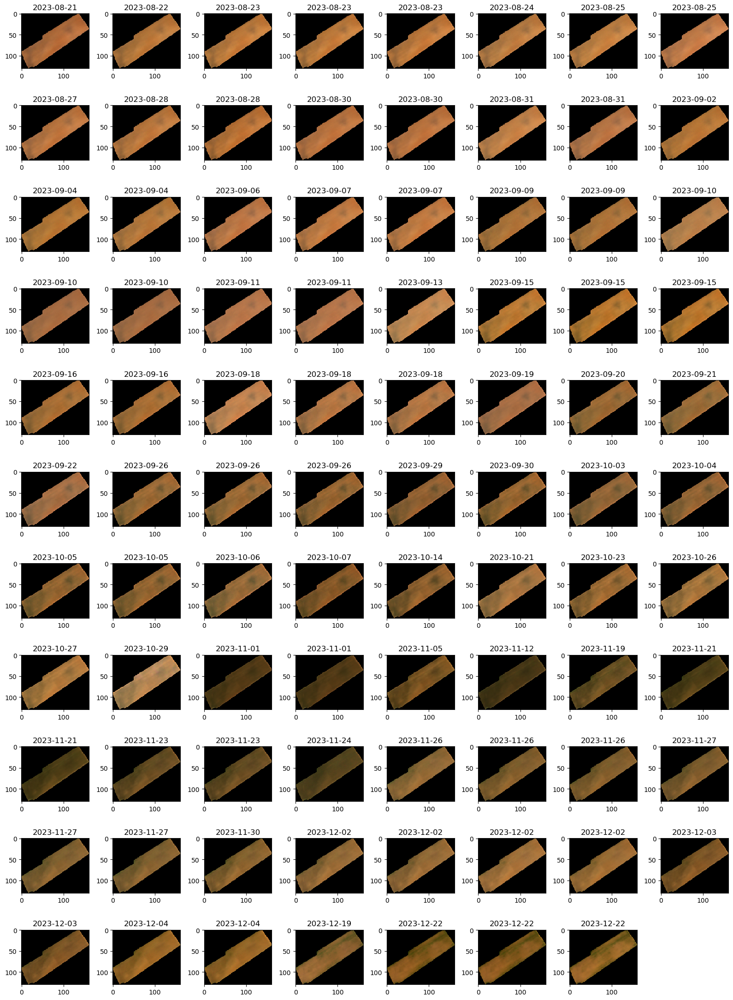

In [5]:
import warnings
warnings.filterwarnings("ignore")

rgb_bands = ['B06', 'B04', 'B02']
# time_series_scenes.sel(band=rgb_bands).plot.imshow(col='time', robust=True)
columns = 8
rows = (da['planet_data'].date.size // columns) +  int((da['planet_data'].date.size % columns) > 0 )
fig, axs = plt.subplots(rows, columns, figsize=(columns * 2, rows * 2))
axs = axs.ravel()
for i, date in enumerate(da['planet_data'].date.values):
    rgb = da['planet_data'].sel(date=date).sel(band=rgb_bands).values / 10000
    axs[i].imshow((rgb.transpose(1, 2, 0) * 4 * 255).astype(np.uint8), interpolation='nearest')
    axs[i].set_title(date.astype('datetime64[D]'))
    # axs[i].axis('off')
for i in range(da['planet_data'].date.size, rows*columns):
    axs[i].axis('off')
plt.tight_layout()

NDVI images:

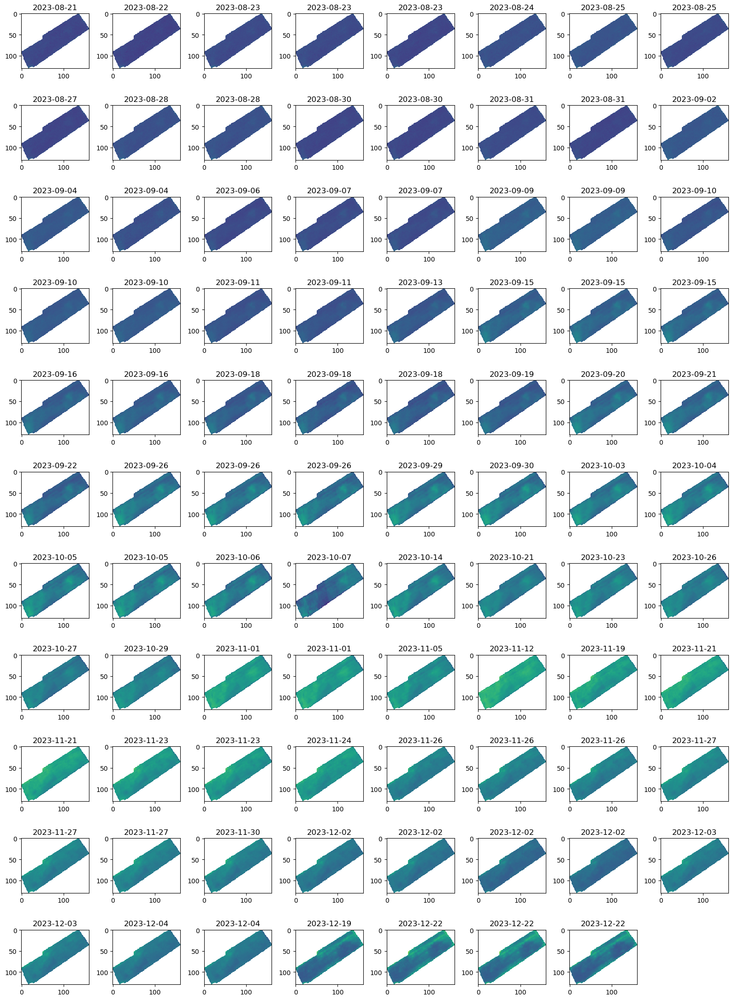

In [6]:
# time_series_scenes.sel(band=rgb_bands).plot.imshow(col='time', robust=True)
columns = 8
rows = (da['planet_data'].date.size // columns) +  int((da['planet_data'].date.size % columns) > 0 )
fig, axs = plt.subplots(rows, columns, figsize=(columns * 2, rows * 2))
axs = axs.ravel()
for i, date in enumerate(da['planet_data'].date.values):
    B08 = da['planet_data'].sel(date=date).sel(band='B08').values
    B06 = da['planet_data'].sel(date=date).sel(band='B06').values
    ndvi = (B08 - B06) / (B08 + B06)
    axs[i].imshow(ndvi, interpolation='nearest', vmin=0, vmax=1, cmap='viridis')
    axs[i].set_title(date.astype('datetime64[D]'))
    # axs[i].axis('off')
for i in range(da['planet_data'].date.size, rows*columns):
    axs[i].axis('off')
plt.tight_layout()


NDVI time series:

<Figure size 1200x600 with 0 Axes>

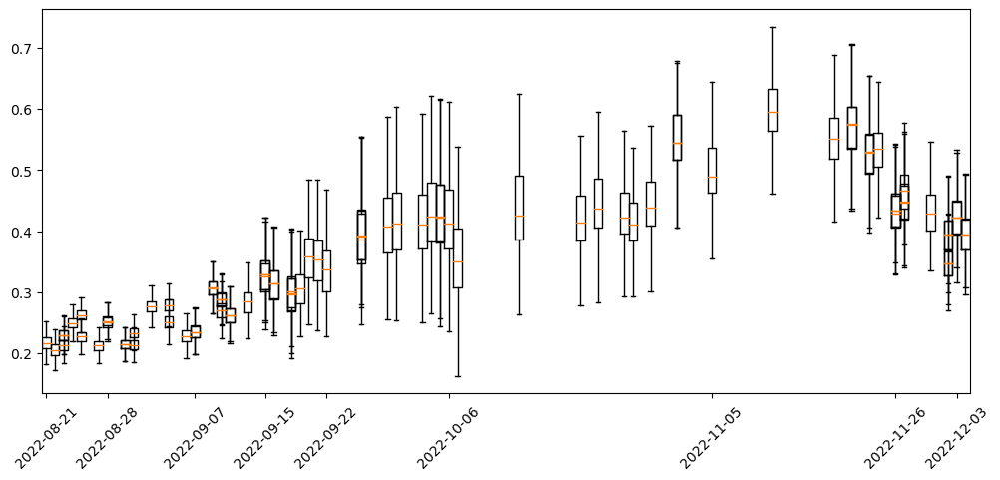

In [7]:
import datetime
start_date = "2023-08-20"
end_date = "2023-12-10"

start_date = np.datetime64(start_date)
end_date = np.datetime64(end_date)
date_mask = (da['date'] >= start_date) & (da['date'] <= end_date)


planet_refs = (da['planet_data'][date_mask].values / 10000).transpose(1,0,2,3)
planet_uncs = (da['planet_data'][date_mask].values / 10000 * 0.1).transpose(1,0,2,3)


doys = da['date'][date_mask].dt.dayofyear.values

mask = ~np.isfinite(planet_refs).all(axis=(0)).any(axis=(0))
planet_refs = planet_refs[:, :, ~mask]
planet_uncs = planet_uncs[:, :, ~mask]

ndvi = (planet_refs[7] - planet_refs[5]) / (planet_refs[7] + planet_refs[5])

plt.figure(figsize=(12, 6))
fig, ax = plt.subplots(figsize=(12,5))
_ = plt.boxplot(ndvi.reshape(len(doys), -1).T, positions=doys, widths=1, showfliers=False)
ax.set_xticks(doys[::10])
ax.set_xticklabels([(datetime.datetime(2022, 1, 1) + datetime.timedelta(days=int(doy-1))).strftime('%Y-%m-%d') for doy in doys[::10]])
_ = plt.xticks(rotation=45)

The target field has a maximum NDVI of around 0.5, as a rainfed wheat field in the region. It seems that there is a draught event during the green up period around early October 2023. We can check the soil moisture data to confirm this.

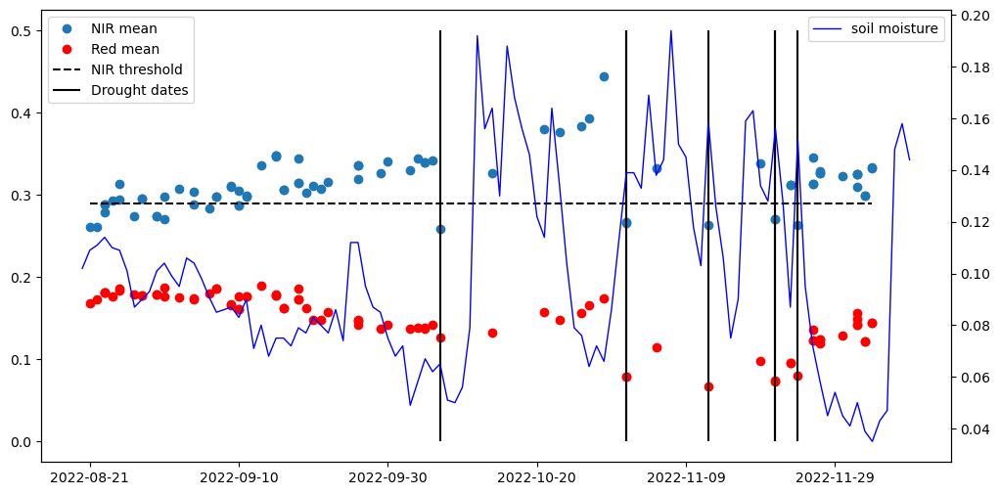

In [8]:
# some of the dates having low NIR values
# potentially due to rain or irrigation
# we will remove these dates from the dataset

import matplotlib.pyplot as plt

mean_nir = np.nanmedian(planet_refs[7], axis=1)
mean_red = np.nanmedian(planet_refs[5], axis=1)


plt.figure(figsize=(12, 6))

_ = plt.plot(doys, mean_nir, 'o', label='NIR mean')
_ = plt.plot(doys, mean_red, 'ro', label='Red mean')


plt.plot([doys[0], doys[-1]], [0.29, 0.29], 'k--', label='NIR threshold')


low_nir_days = doys[(mean_nir < 0.29) & (doys > 270)]

plt.vlines(low_nir_days, 0., 0.5, color='k', label = 'Drought dates')

# _ = plt.boxplot(ndvi.reshape(len(doys), -1).T, positions=doys, widths=1, showfliers=False)
# plt.fill_between([300-3, 300+3], 0.5, color='grey', alpha=0.2, label='start of growth season')
# draught_days = doys[(doys >= 300-3) & (doys <= 300+3)]

plt.legend(loc=2)

# plot soil moisture with shared x-axis
ax = plt.twinx()

import pandas as pd
# NASA_SMAP_SPL4SMGP_007 data
df = pd.read_csv('./files/SF_2023_soil_moisture.csv')
df['Time'] = pd.to_datetime(df['Time'])
# take the 3 row of each day
df = df.groupby('Time').nth(3)
df.index = df.Time
soil_moisture_doys = df.index.dayofyear
ax.plot(soil_moisture_doys, df['sm_surface'], 'b-', lw=1, label = 'soil moisture')



ax.set_xticks(np.arange(doys[0], doys[-1], 20))
ax.set_xticklabels([(datetime.datetime(2022, 1, 1) + datetime.timedelta(days=int(doy-1))).strftime('%Y-%m-%d') for doy in np.arange(doys[0], doys[-1], 20)])


ax.legend(loc=1)

Since the current archetype does not deal with soil moisture, we remove days with low soil miosture from the analysis.

[250 250]


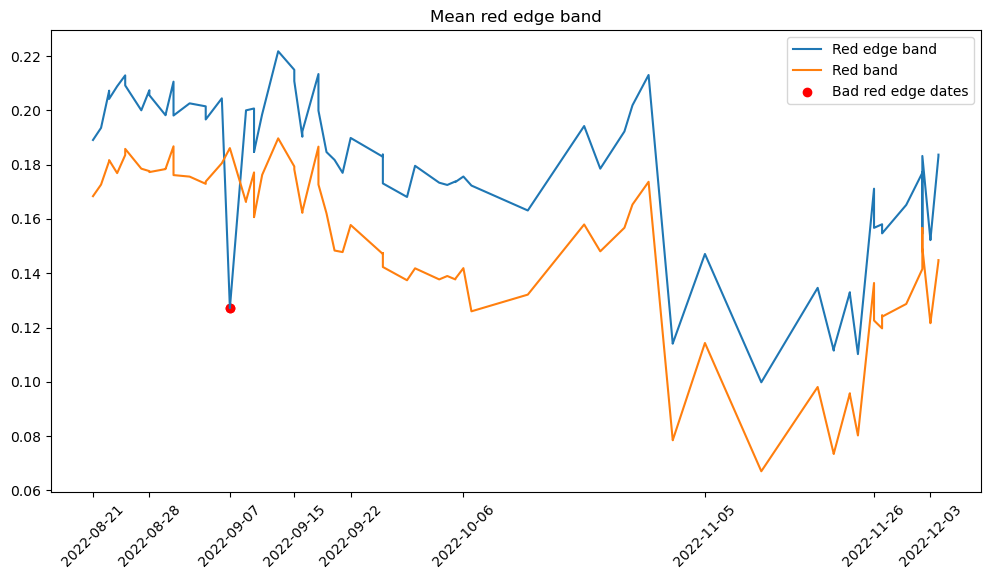

In [9]:
mean_read_edge = np.nanmean(planet_refs[6], axis=(1))
plt.figure(figsize=(12, 6))
plt.plot(doys, mean_read_edge, label = 'Red edge band')
plt.plot(doys, mean_red, label = 'Red band')
plt.xticks(doys[::10], [(datetime.datetime(2022, 1, 1) + datetime.timedelta(days=int(doy-1))).strftime('%Y-%m-%d') for doy in doys[::10]], rotation=45)
bad_red_edge = (mean_read_edge < 0.15) & (doys < 300)
bad_red_edge_doys = doys[bad_red_edge]
print(bad_red_edge_doys)
plt.scatter(doys[bad_red_edge], mean_read_edge[bad_red_edge], color='red', label='Bad red edge dates')
plt.title('Mean red edge band')
plt.legend()

On doy 250 (October 7th), there is an anormal decrease in the red edge band but not in the red band, it is likely due to sensor calibration issues. We can remove this day from the analysis.

# Running ARC

We now proceed to run the ARC code toi estimate the archeytpe model parameters from the Planet observations, for each pixel, fitting to the time series of Planet reflectances. The method is described in Feng et al. (2024).


The Planet PS2.SD data has been calirateed to S2 reflectance, which makes it straightforward to use the ARC code. The bands for the Planet data are:

| Band | Name                 | Wavelength (fwhm) | Interoperable with Sentinel-2 |
|---|---|---|---|
| 1   | Coastal Blue        | 443 (20)          | Yes - with Sentinel-2 band 1    |
| 2   | Blue                 | 490 (50)          | Yes - with Sentinel-2 band 2    |
| 3   | Green I               | 531 (36)          | No equivalent with Sentinel-2   |
| 4   | Green                | 565 (36)          | Yes - with Sentinel-2 band 3    |
| 5   | Yellow               | 610 (20)          | No equivalent with Sentinel-2   |
| 6   | Red                  | 665 (31)          | Yes - with Sentinel-2 band 4    |
| 7   | Red Edge             | 705 (15)          | Yes - with Sentinel-2 band 5    |
| 8   | NIR                  | 865 (40)          | Yes - with Sentinel-2 band 8a   |

So, we can directly swap the S2 band 2, 3, 4, 5，8a with the Planet bands 2, 4, 6, 7, 8 and assume a uncertainty of 10% for the Planet data.

In [10]:
start_date = np.datetime64(start_date)
end_date = np.datetime64(end_date)

date_mask = (da['date'] >= start_date) & (da['date'] <= end_date)  & (~da['date'].dt.dayofyear.isin(low_nir_days)) & (~da['date'].dt.dayofyear.isin(bad_red_edge_doys))


planet_refs = (da['planet_data'][date_mask].values / 10000).transpose(1,0,2,3)

s2_angles = np.array([da['sza'][date_mask].values, da['vza'][date_mask].values, da['raa'][date_mask].values])
doys = da['date'][date_mask].dt.dayofyear.values

mask = ~np.isfinite(planet_refs).all(axis=(0)).any(axis=(0))


s2_refs = np.zeros((10, len(doys), planet_refs.shape[2], planet_refs.shape[3])) * np.nan

s2_refs[0] = planet_refs[1]
s2_refs[1] = planet_refs[3]
s2_refs[2] = planet_refs[5]
s2_refs[3] = planet_refs[6]
s2_refs[7] = planet_refs[7]


s2_refs = s2_refs[:, :, ~mask]
# assume 10% uncertainty
s2_uncs = s2_refs * 0.1 
# set the unavailable bands to have uncertainty of 10
s2_uncs[[4, 5, 6, 8, 9]] = 10

The user can expore various parameters here in the notebook:

START_OF_SEASON = 240

CROP_TYPE = "wheat"

NUM_SAMPLES = 100000

GROWTH_SEASON_LENGTH = 30

start_date = "2023-08-20"

end_date = "2023-12-10"

These are set to be appropriate for the crop under study (wheat). The time taken to process depends heavily on NUM_SAMPLES which controls the number of ensemble members used in the evaluation. Typically 100000 would be sufficient to estimate the mean behaviour. Estimating uncertainty typically requires more members. We use 1000000 here as a default to ensure we get a good solution. This will take around 5 minutes to process, so if you are impatient to proceed, reduce the value of NUM_SAMPLES.


Predicting S2 reflectance: 100%|███████████████████████████████████████████████████████████████████████████████████████████████| 300/300 [04:05<00:00,  1.22slice/s]


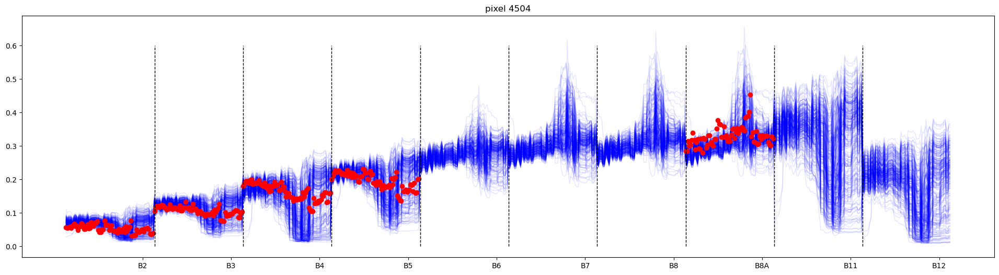

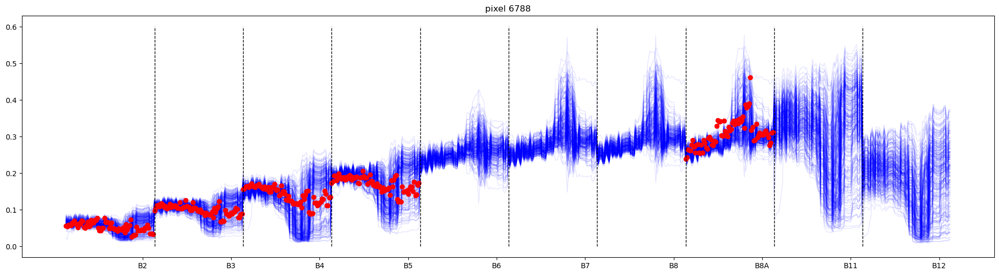

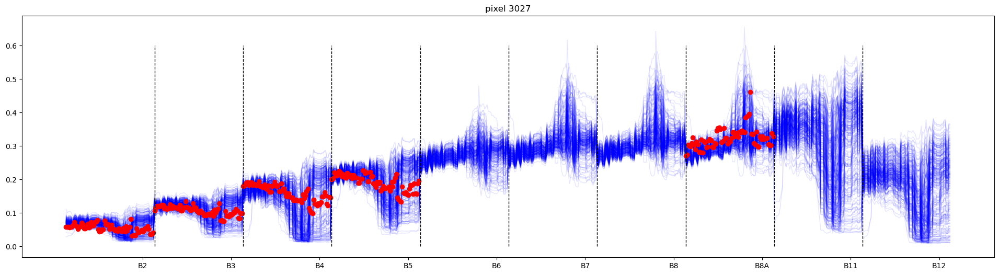

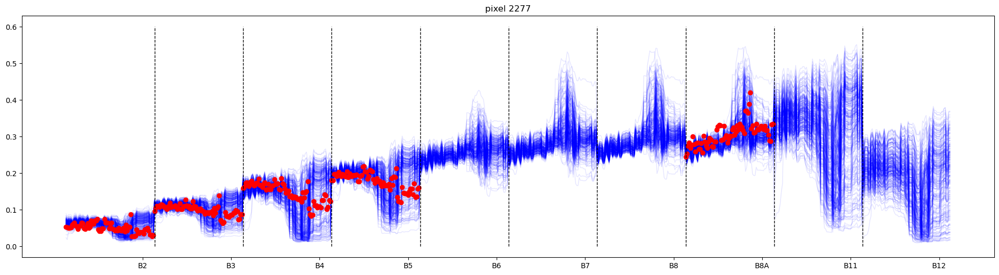

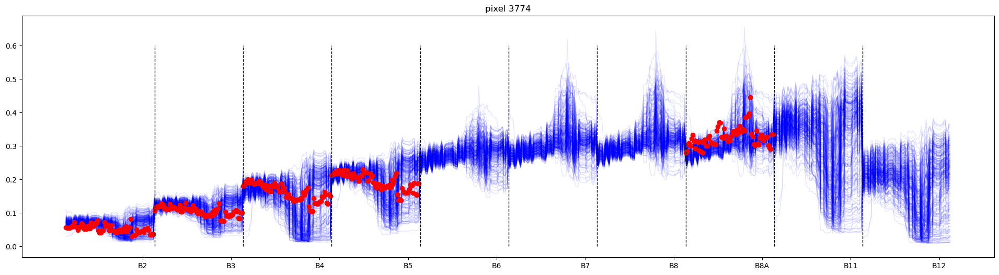

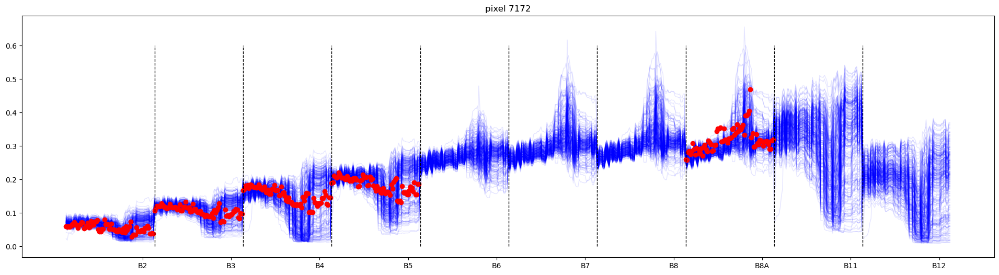

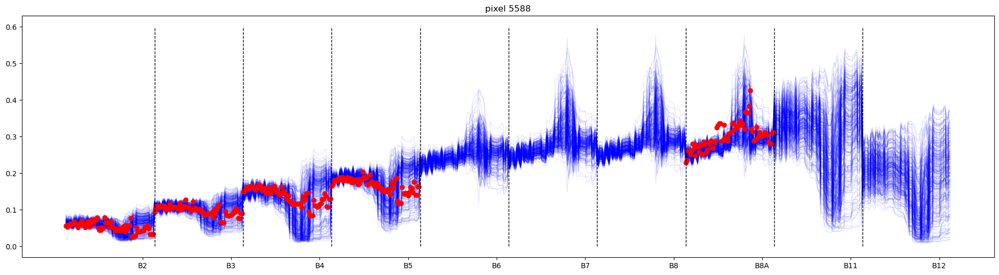

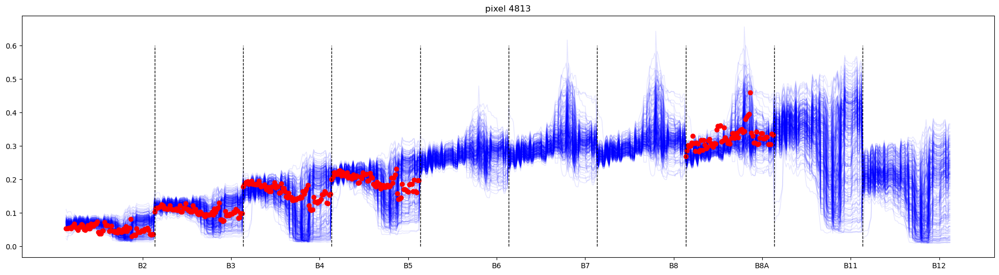

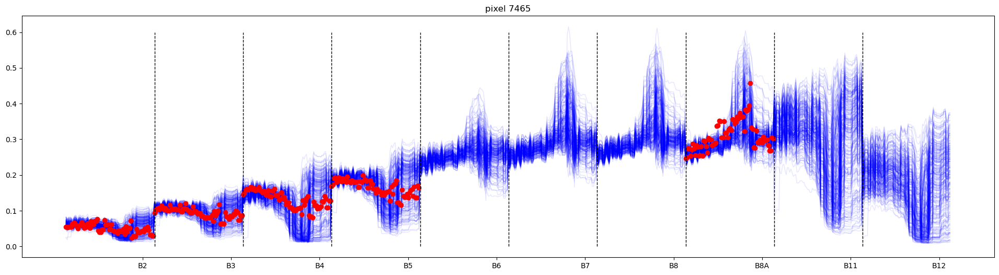

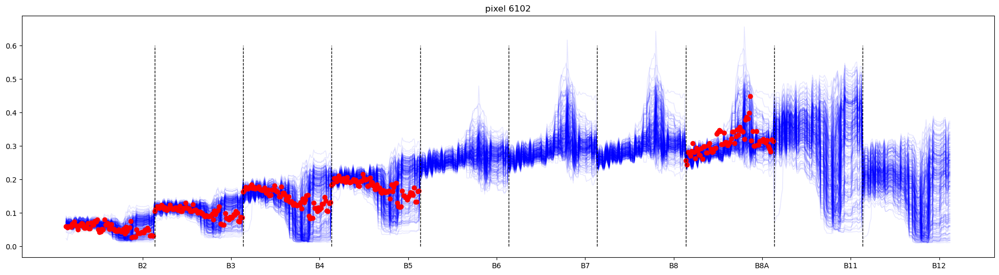

In [11]:
# Constants
START_OF_SEASON = 240
CROP_TYPE = "wheat"
NUM_SAMPLES = 1000000
GROWTH_SEASON_LENGTH = 30


# plotting constants
LAZY_EVALUATION_STEP = 100
ALPHA = 0.8
LINE_WIDTH = 2


plot = True

arc_refs, pheo_samples, bio_samples, orig_bios, soil_samples = generate_arc_refs(
    doys, START_OF_SEASON, GROWTH_SEASON_LENGTH, NUM_SAMPLES, s2_angles, CROP_TYPE
)

# Get neighbours
neighbours = get_neighbours(s2_refs, s2_uncs, arc_refs, doys, steps=10, k=300)

if plot:
    random_inds = np.random.choice(s2_refs.shape[-1], 10)
    for i in random_inds:
        import matplotlib.pyplot as plt
        plt.figure(figsize=(24, 6))
        plt.title(f"pixel {i}")
        plt.plot(arc_refs[:, :, neighbours[i]].reshape(-1, 300), '-', color='b', lw=1, alpha=0.1)
        plt.plot(s2_refs[:, :, i].ravel(), 'o', color='red')
        vlines = [len(doys) * i for i in range(1, 10)]
        plt.vlines(vlines, 0, 0.6, color='black', lw=1, ls='--')
        text_locs = [len(doys) * i - 10 for i in range(1, 11)]
        bands = ['B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12']
        plt.xticks(text_locs, bands)
        plt.show()

# Assimilate data
post_bio_tensor, post_bio_unc_tensor, post_bio_scale_tensor, post_pheo_tensor, post_soil_tensor, _, _ = assimilate(
    s2_refs, arc_refs, s2_uncs, pheo_samples, bio_samples, soil_samples, orig_bios, neighbours
)

# Concatenate tensors
scale_data = np.concatenate([post_bio_scale_tensor, post_pheo_tensor, post_soil_tensor], axis=1)

We use the ARC code to generate ensembles of reflectance and get the closest match to the observations. Then, the closest ensembles are used to calculate the time series of biophysical variables, such as LAI, Cab, Cw, Cm, and N. 

We also illustrate the optimal set of ensemble reflectance members (blue lines) and observations (red dots). You should be able to see whether or not the ensembles cover the reflectance at each waveband. If not, then consider changing the parameters, e.g. the season start or end or the number of ensemble samnples.

Now, we can plot samples of the estimated LAI trajecties over time, and the images of LAI over the field.

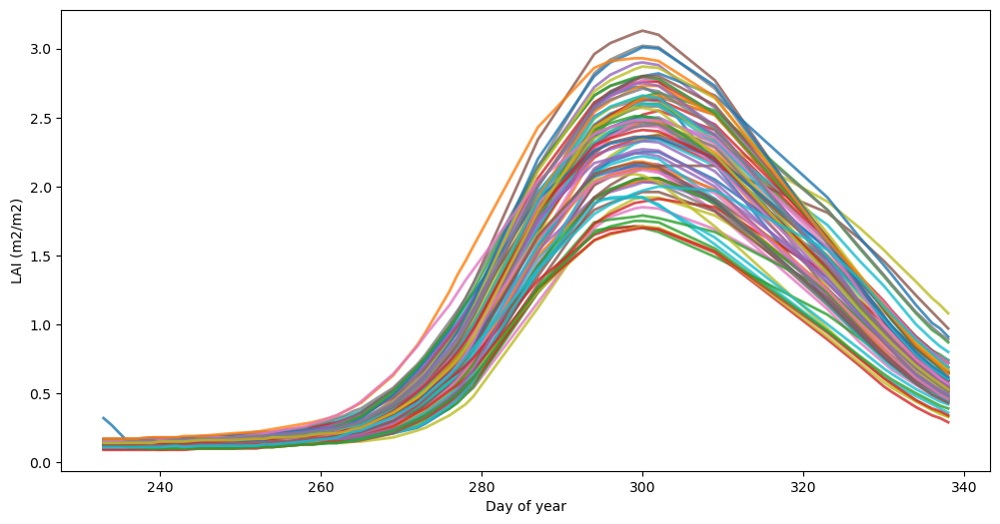

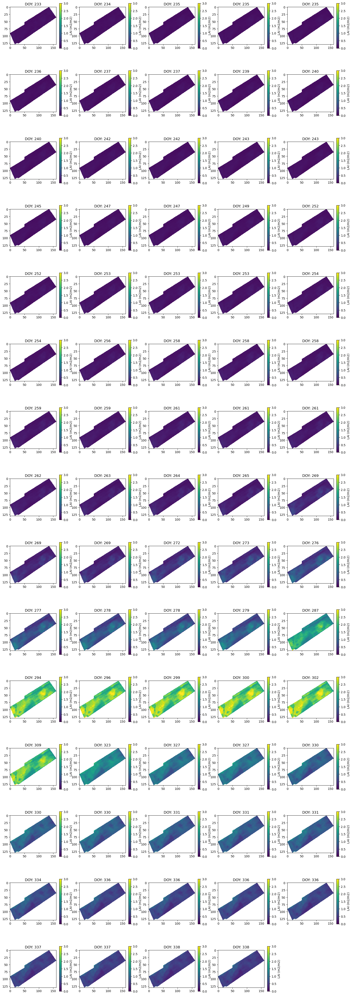

In [12]:

def plot_lai_over_time(doys: np.array, post_bio_tensor: np.array):
    """Plot LAI over time"""

    plt.figure(figsize=(12, 6))
    plt.plot(
        doys,
        post_bio_tensor[
            ::LAZY_EVALUATION_STEP,
            4,
        ].T
        / 100,
        "-",
        lw=LINE_WIDTH,
        alpha=ALPHA,
    )
    plt.ylabel("LAI (m2/m2)")
    plt.xlabel("Day of year")
    plt.show()


def plot_lai_maps(doys: np.array, post_bio_tensor: np.array, mask: np.array):
    """Plot LAI maps"""

    lai = post_bio_tensor[:, 4].T / 100
    nrows = int(len(doys) / 5) + int(len(doys) % 5 > 0)
    fig, axs = plt.subplots(ncols=5, nrows=nrows, figsize=(20, 4 * nrows))
    axs = axs.ravel()

    for i in range(len(doys)):
        lai_map = np.zeros(mask.shape) * np.nan
        lai_map[~mask] = lai[i]
        im = axs[i].imshow(lai_map, vmin=0, vmax=3)
        fig.colorbar(im, ax=axs[i], shrink=0.8, label="LAI (m2/m2)")
        axs[i].set_title("DOY: %d" % doys[i])

    # remove empty plots
    for i in range(len(doys), len(axs)):
        axs[i].axis("off")
    plt.show()



plot_lai_over_time(doys, post_bio_tensor)
plot_lai_maps(doys, post_bio_tensor, mask)

There is also a plot of sample LAI trajectories over time. We observe that maximum LAI seems to be reached around DOY 300 (October 27th). We can check if this is a sensible interpretation by looking at the exploratory data above.

An image of the spatial LAI interpretation is also shown. Again, we can see the maximum LAI occurring around DOY 300. We notice quite a large variation in apparent LAI over the field, with the south-western and north-eastern portions of the field having maximum LAI of greater that 2.5, while other areas have LAI of less than 2.

The areial view of the field from Google Earth can be accessed from [here](https://earth.google.com/web/@-28.18725539,28.19386161,1703.19042647a,1222.58165291d,35y,0.00000084h,0t,0r/data=OgMKATA)

Planet monthly composite images can be accessed from [here](https://www.planet.com/stories/sf_2023_monthly_mosaic-7e_rLibSg).

## Leaf Area Index results

We can now check the estimated LAI values against the ground measurements. The ground measurements are available in the file [SF_2023_ground_measurements_LAI_Cab.geojson](./files/SF_2023_ground_measurements_LAI_Cab.geojson).

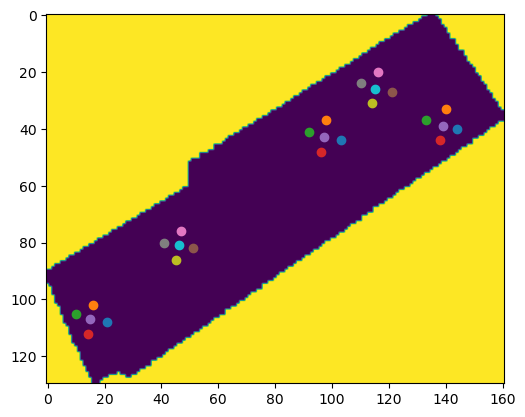

In [13]:
import geojson
from shapely import geometry

features = geojson.load(open('./files/SF_2023_ground_measurements_LAI_Cab.geojson', 'r'))['features']
geoms = []
coords = []
for feature in features:
    
    coord = feature['geometry']['coordinates']
    coords.append(coord[:2])
    
    geom = geometry.Point(coord)
    geoms.append(geom)
geometry.GeometryCollection(geoms)

geotransform = tuple(np.array(da.spatial_ref.GeoTransform.split()).astype(float).tolist())
crs = str(da.spatial_ref.crs_wkt)

from pyproj import Transformer
transformer = Transformer.from_crs("EPSG:4326", crs, always_xy=True)
Tcoords = [i for i in transformer.itransform(coords)]


Acoords = np.array([[(i[0] - geotransform[0]) / geotransform[1], (i[1] - geotransform[3]) / geotransform[5]] for i in Tcoords]).astype(int)

for i in Acoords:
    plt.plot(i[0],i[1], 'o')
plt.imshow(mask)

In [14]:
s2_lai = post_bio_tensor[:, 4]
s2_cab = post_bio_tensor[:, 1]

temp = np.zeros(mask.shape + (s2_lai.shape[1], ))
temp[~mask] = s2_lai
s2_lai = temp

temp = np.zeros(mask.shape + (s2_cab.shape[1], ))
temp[~mask] = s2_cab
s2_cab = temp

We can visualise the 5 sample locations, with 5 white crosses in the image below indicating the sub0-sampling. Foe each of the 5 samplke plots, we apply a buffer of n = 6 i.e. a +/- 6 5m pixels around each sample location, so the samples cover around 70 m x 70 m.

The base image shows the maximum LAI per pixel, confirming the observation above from NDVI that the LAI is higher in the lower left iof the field.

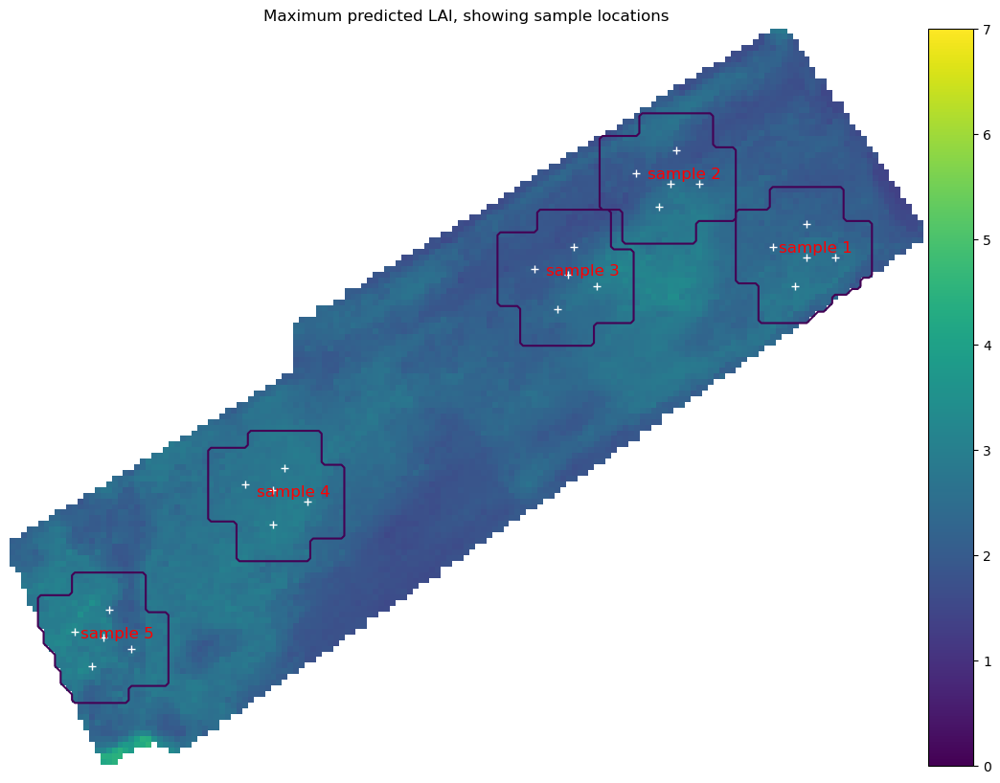

In [15]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

# buffer control
n = 6

fig, axs = plt.subplots(nrows=1, ncols = 1, figsize=(20,10))
#axs = axs.ravel()
ax = axs
ax.set_title('Maximum predicted LAI, showing sample locations',fontsize=12)
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
mm = np.max(s2_lai,axis=2)/100.
mm[mm==0] = np.nan
all_data = []
im = ax.imshow(mm,vmin=0,vmax=7, interpolation=None)
fig.colorbar(im, cax=cax, orientation='vertical')
for i in range(1, 6):
    c =[]
    data = []
    for j in range(1, 6):
        for feature in features:
            field_id = feature['properties']['Name']
            if field_id == f'P{i}S{j}':
                coord = feature['geometry']['coordinates'][:2]
                geom = geometry.Point(coord)
                
                Tcoord = transformer.transform(coord[0], coord[1])
                Acoord = (Tcoord[0] - geotransform[0]) / geotransform[1], (Tcoord[1] - geotransform[3]) / geotransform[5]
                Acoord = np.round(np.array(Acoord)).astype(int) 
                #print(Acoord[1], Acoord[0],np.max(s2_lai[Acoord[1], Acoord[0]]/100.))
                c.append([Acoord[1], Acoord[0]])
                
                lai = feature['properties']['LAI_measurement']
                # cab = feature['properties']['Cab_measurement']
                
                data.append(lai)
    all_data.append(data)
    mask = np.max(s2_lai,axis=2)>0
    omask = mask.copy()
    
    
    #plt.imshow(np.max(s2_lai,axis=2)/100.)
    #plt.imshow(mask)
    #plt.colorbar()
    # buffer +/-n pixels
    
    c = np.array(c)
    for cc in c:
        for k in range(-n,n+1):
            for j in range(-n,n+1):
                try:
                    mask[cc[0]+k,cc[1]+j] = 0
                except:
                    pass
    mask = omask * ~mask
    ax.contour(mask)
    y,x = np.round(c.mean(axis=0)).astype(int)
    ax.text(x-4,y, f'sample {i}', color="red", fontsize=12)
    ax.plot(c.T[1],c.T[0],'w+')

ax.set_axis_off()

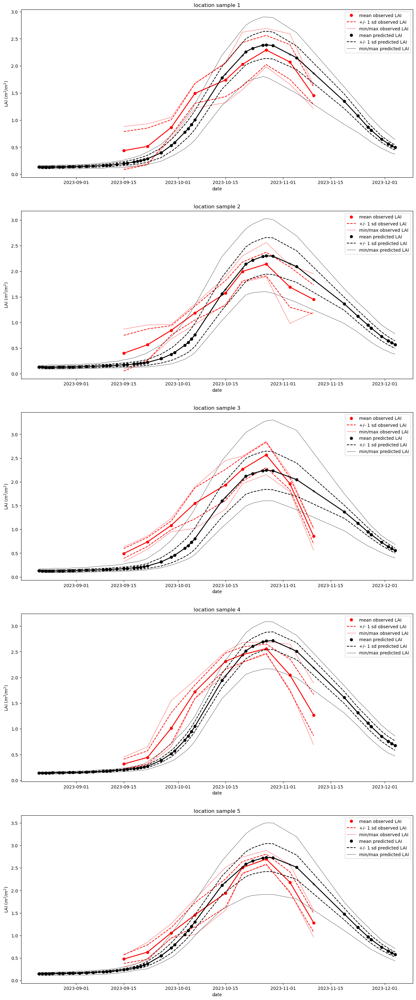

In [16]:
import datetime
import geojson
from shapely import geometry
import pylab as plt


features = geojson.load(open('./files/SF_2023_ground_measurements_LAI_Cab.geojson', 'r'))['features']
geoms = []

s2_dates = [datetime.datetime(2023, 1, 1) + datetime.timedelta(days=int(i-1)) for i in doys]

# interpolate to target dates
sample_dates = np.array([int(d.strftime("%j")) for d in s2_dates])


fig, axs = plt.subplots(nrows=5, ncols = 1, figsize=(16, 40))
axs = axs.ravel()

all_target_s2_pred = []
all_data = []
for i in range(1, 6):
    ax = axs[i-1]
    c =[]
    data = []
    for j in range(1, 6):
        for feature in features:
            field_id = feature['properties']['Name']
            if field_id == f'P{i}S{j}':
                coord = feature['geometry']['coordinates'][:2]
                geom = geometry.Point(coord)
                
                Tcoord = transformer.transform(coord[0], coord[1])
                Acoord = (Tcoord[0] - geotransform[0]) / geotransform[1], (Tcoord[1] - geotransform[3]) / geotransform[5]
                Acoord = np.round(np.array(Acoord)).astype(int) 
                #print(Acoord[1], Acoord[0],np.max(s2_lai[Acoord[1], Acoord[0]]/100.))
                c.append([Acoord[1], Acoord[0]])
                
                lai = feature['properties']['LAI_measurement']
                # cab = feature['properties']['Cab_measurement']
                
                data.append(lai)
                dates = [datetime.datetime.strptime(i, '%Y%m%d') for i in feature['properties']['measurement_dates']]
                target_dates = np.array([int(d.strftime("%j")) for d in dates])

    all_data.append(data)
    mask = np.max(s2_lai,axis=2)>0
    omask = mask.copy()
    
    
    
    #plt.imshow(np.max(s2_lai,axis=2)/100.)
    #plt.imshow(mask)
    #plt.colorbar()
    # buffer +/-n pixels
    
    c = np.array(c)
    for cc in c:
        for k in range(-n,n+1):
            for j in range(-n,n+1):
                try:
                    mask[cc[0]+k,cc[1]+j] = 0
                except:
                    pass
    mask = omask * ~mask
        #plt.plot(cc[1],cc[0],'w+')
    #_=plt.imshow(mask * s2_lai.max(axis=2)/100.,vmin=0,vmax=2.5)
    #plt.colorbar()
    #_=plt.plot(s2_dates,(s2_lai[mask]/100.).T,'g+')
    _=ax.plot(dates, np.mean(data,axis=0).T,'r',lw=2)
    _=ax.plot(dates, np.mean(data,axis=0).T,'ro',label='mean observed LAI')
    _=ax.plot(dates, np.mean(data,axis=0).T + np.std(data,axis=0).T,'r--',label='+/- 1 sd observed LAI')
    _=ax.plot(dates, np.mean(data,axis=0).T - np.std(data,axis=0).T,'r--')

    _=ax.plot(dates, np.min(data,axis=0),'r-',lw=0.5,label='min/max observed LAI')
    _=ax.plot(dates, np.max(data,axis=0),'r-',lw=0.5)
    ax.plot(s2_dates,np.mean(s2_lai[mask]/100.,axis=0),'k-',lw=2)
    ax.plot(s2_dates,np.mean(s2_lai[mask]/100.,axis=0),'ko',label='mean predicted LAI')

    ax.plot(s2_dates,np.mean(s2_lai[mask]/100.,axis=0)+np.std(s2_lai[mask]/100.,axis=0),'k--',label='+/- 1 sd predicted LAI')
    ax.plot(s2_dates,np.mean(s2_lai[mask]/100.,axis=0)-np.std(s2_lai[mask]/100.,axis=0),'k--')

    ax.plot(s2_dates,np.min(s2_lai[mask]/100.,axis=0),'k-',lw=0.5,label='min/max predicted LAI')
    ax.plot(s2_dates,np.max(s2_lai[mask]/100.,axis=0),'k-',lw=0.5)
    ax.set_xlabel('date')
    ax.set_ylabel('LAI $(m^2/m^2)$')
    ax.set_title(f'location sample {i}',fontsize=12)
    
    # interpolate to target dates
    target_s2_pred = np.array([np.interp(target_dates,sample_dates,d) for d in (s2_lai[mask]/100.)]).T
    _=ax.plot(dates,np.mean(target_s2_pred,axis=1),'k+')
    all_target_s2_pred.append(target_s2_pred)
    ax.legend()

The plots above visualise the observed (red) and predicted (black) patterns of LAI over time. The 9 field observations are shown as red dots. The LAI predicted from Planet using ARC is calculated at regular intervals (black dots).

The results show a similar results for the 5 different samples and close agreement between the observed and predicted LAI values. However, there is a general overestimation of LAI from the Planet data.

If we plot the measured and Planet-ARC-modelled data together for each of the 5 sample locations and 9 time periods, we can see how well the model predicts the (independent) LAI observations.

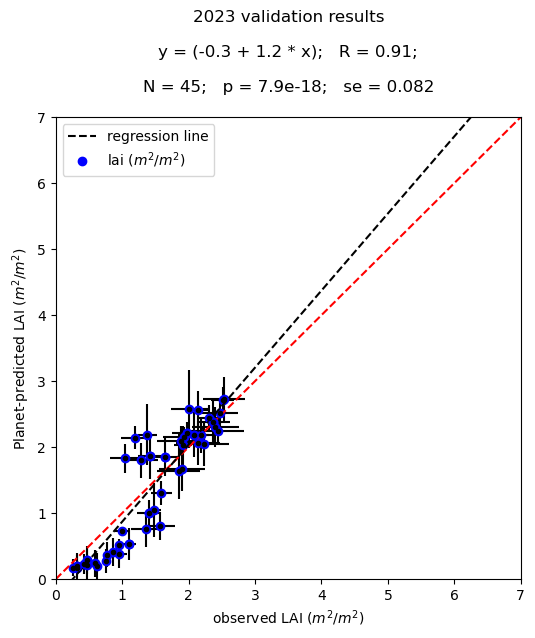

In [17]:
# plot limit
m = 7

mean_pred = np.array([np.mean(d,axis=1) for d in all_target_s2_pred])
mean_obs = np.mean(all_data,axis=0)
std_pred = np.array([np.std(d,axis=1) for d in all_target_s2_pred])
std_obs = np.std(all_data,axis=0)

plt.figure(figsize=(6,6))
plt.errorbar(mean_obs.ravel(),mean_pred.ravel(),std_obs.ravel(),std_pred.ravel(),'k.')
plt.plot(mean_obs,mean_pred,'bo')

plt.plot([0.,m],[0.,m],'r--')
plt.xlabel('observed LAI ($m^2/m^2$)')
plt.ylabel('Planet-predicted LAI ($m^2/m^2$)')

plt.xlim(0,m)
plt.ylim(0,m)

from scipy.stats import linregress
slope, intercept, r, p, se = linregress(mean_obs.ravel(),mean_pred.ravel())

plt.title(f'2023 validation results\n\ny = ({intercept:.2} + {slope:.2} * x);   R = {r:.2};\n\nN = 45;   p = {p:.2};   se = {se:.2}\n')
plt.plot([0.,m],[intercept,intercept+slope*m],'k--',\
         label=f'regression line')

plt.plot(mean_obs[0],mean_pred[0],'bo',label='lai ($m^2/m^2$)')

_=plt.legend()


name = 'lai'
TAG = 'planet_2023'
np.savez(f'data/{TAG}_{name}.npz',mean_pred=mean_pred,mean_obs=mean_obs,std_pred=std_pred,std_obs=std_obs)

The plot shows Planet-ARC-predicted LAI (y-axis) against observed LAI (x-axis) for the 5 x 9 (N=45) samples. The LAI mean samples over the 5 sub-locations for observations and over the buffer areas shown above are used to calculate mean and standard deviation. The mean is shown as the blue dot, with +/- 1 standard deviation shown as the error bars.

The regression shows a strong linear relationship (R=0.91) between LAI predicted from Planet compared to ground observations for 2023. But there is a small bias close to 0 and a slope of 1.2, but mostly agree well with the observed LAI.

## Chlorophyll results

We now examine the results for Chlorophyll (Cab), following the same approach as above:



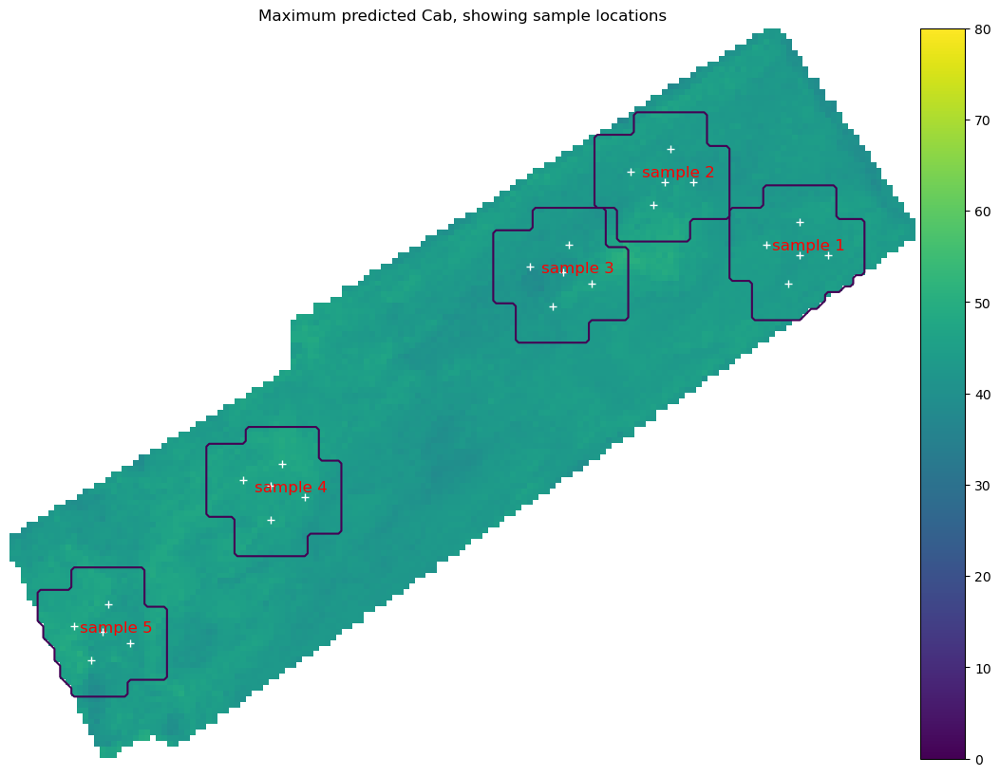

In [18]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

# buffer control
n = 6

fig, axs = plt.subplots(nrows=1, ncols = 1, figsize=(20,10))
#axs = axs.ravel()
ax = axs
ax.set_title('Maximum predicted Cab, showing sample locations',fontsize=12)
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
mm = np.max(s2_cab,axis=2)/100.
mm[mm==0] = np.nan
im = ax.imshow(mm,vmin=0,vmax=80)
fig.colorbar(im, cax=cax, orientation='vertical')
for i in range(1, 6):
    c =[]
    data = []
    for j in range(1, 6):
        for feature in features:
            field_id = feature['properties']['Name']
            if field_id == f'P{i}S{j}':
                coord = feature['geometry']['coordinates'][:2]
                geom = geometry.Point(coord)
                
                Tcoord = transformer.transform(coord[0], coord[1])
                Acoord = (Tcoord[0] - geotransform[0]) / geotransform[1], (Tcoord[1] - geotransform[3]) / geotransform[5]
                Acoord = np.round(np.array(Acoord)).astype(int) 
                #print(Acoord[1], Acoord[0],np.max(s2_lai[Acoord[1], Acoord[0]]/100.))
                c.append([Acoord[1], Acoord[0]])
                
                lai = feature['properties']['Cab_measurement']
                # cab = feature['properties']['Cab_measurement']
                
                data.append(lai)
    all_data.append(data)
    mask = np.max(s2_cab,axis=2)>0
    omask = mask.copy()
    
    
    #plt.imshow(np.max(s2_lai,axis=2)/100.)
    #plt.imshow(mask)
    #plt.colorbar()
    # buffer +/-n pixels
    
    c = np.array(c)
    for cc in c:
        for k in range(-n,n+1):
            for j in range(-n,n+1):
                try:
                    mask[cc[0]+k,cc[1]+j] = 0
                except:
                    pass
    mask = omask * ~mask
    ax.contour(mask)
    y,x = np.round(c.mean(axis=0)).astype(int)
    ax.text(x-4,y, f'sample {i}', color="red", fontsize=12)
    ax.plot(c.T[1],c.T[0],'w+')

ax.set_axis_off()


name = 'cab'
TAG = 'planet_2023'
np.savez(f'data/{TAG}_{name}.npz',mean_pred=mean_pred,mean_obs=mean_obs,std_pred=std_pred,std_obs=std_obs)

The maximum Chlorophyll concentration (Cab) predicted by ARC with S2 data is quite consistent over the field, with values around 50 $\mu g/cm^2$

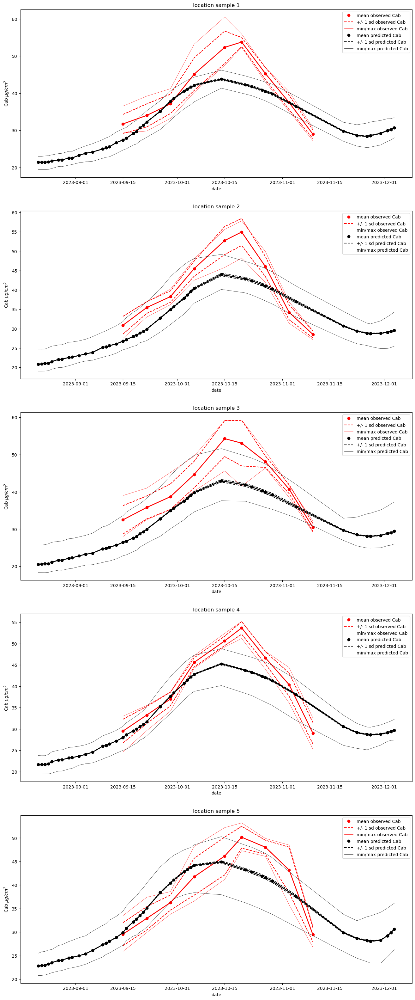

In [19]:
import datetime
import geojson
from shapely import geometry
import pylab as plt


features = geojson.load(open('./files/SF_2023_ground_measurements_LAI_Cab.geojson', 'r'))['features']
geoms = []

s2_dates = [datetime.datetime(2023, 1, 1) + datetime.timedelta(days=int(i-1)) for i in doys]

# interpolate to target dates
sample_dates = np.array([int(d.strftime("%j")) for d in s2_dates])


fig, axs = plt.subplots(nrows=5, ncols = 1, figsize=(16, 40))
axs = axs.ravel()

all_target_s2_pred = []
all_data = []
for i in range(1, 6):
    ax = axs[i-1]
    c =[]
    data = []
    for j in range(1, 6):
        for feature in features:
            field_id = feature['properties']['Name']
            if field_id == f'P{i}S{j}':
                coord = feature['geometry']['coordinates'][:2]
                geom = geometry.Point(coord)
                
                Tcoord = transformer.transform(coord[0], coord[1])
                Acoord = (Tcoord[0] - geotransform[0]) / geotransform[1], (Tcoord[1] - geotransform[3]) / geotransform[5]
                Acoord = np.round(np.array(Acoord)).astype(int) 
                #print(Acoord[1], Acoord[0],np.max(s2_lai[Acoord[1], Acoord[0]]/100.))
                c.append([Acoord[1], Acoord[0]])
                
                lai = feature['properties']['Cab_measurement']
                # cab = feature['properties']['Cab_measurement']
                
                data.append(lai)
                dates = [datetime.datetime.strptime(i, '%Y%m%d') for i in feature['properties']['measurement_dates']]
                target_dates = np.array([int(d.strftime("%j")) for d in dates])

    all_data.append(data)
    mask = np.max(s2_lai,axis=2)>0
    omask = mask.copy()
    
    
    
    #plt.imshow(np.max(s2_lai,axis=2)/100.)
    #plt.imshow(mask)
    #plt.colorbar()
    # buffer +/-n pixels
    
    c = np.array(c)
    for cc in c:
        for k in range(-n,n+1):
            for j in range(-n,n+1):
                try:
                    mask[cc[0]+k,cc[1]+j] = 0
                except:
                    pass
    mask = omask * ~mask
        #plt.plot(cc[1],cc[0],'w+')
    #_=plt.imshow(mask * s2_lai.max(axis=2)/100.,vmin=0,vmax=2.5)
    #plt.colorbar()
    #_=plt.plot(s2_dates,(s2_lai[mask]/100.).T,'g+')
    _=ax.plot(dates, np.mean(data,axis=0).T,'r',lw=2)
    _=ax.plot(dates, np.mean(data,axis=0).T,'ro',label='mean observed Cab')
    _=ax.plot(dates, np.mean(data,axis=0).T + np.std(data,axis=0).T,'r--',label='+/- 1 sd observed Cab')
    _=ax.plot(dates, np.mean(data,axis=0).T - np.std(data,axis=0).T,'r--')

    _=ax.plot(dates, np.min(data,axis=0),'r-',lw=0.5,label='min/max observed Cab')
    _=ax.plot(dates, np.max(data,axis=0),'r-',lw=0.5)
    ax.plot(s2_dates,np.mean(s2_cab[mask]/100.,axis=0),'k-',lw=2)
    ax.plot(s2_dates,np.mean(s2_cab[mask]/100.,axis=0),'ko',label='mean predicted Cab')

    ax.plot(s2_dates,np.mean(s2_cab[mask]/100.,axis=0)+np.std(s2_lai[mask]/100.,axis=0),'k--',label='+/- 1 sd predicted Cab')
    ax.plot(s2_dates,np.mean(s2_cab[mask]/100.,axis=0)-np.std(s2_lai[mask]/100.,axis=0),'k--')

    ax.plot(s2_dates,np.min(s2_cab[mask]/100.,axis=0),'k-',lw=0.5,label='min/max predicted Cab')
    ax.plot(s2_dates,np.max(s2_cab[mask]/100.,axis=0),'k-',lw=0.5)
    ax.set_xlabel('date')
    ax.set_ylabel('Cab $\mu g / cm^2$')
    ax.set_title(f'location sample {i}',fontsize=12)
    
    # interpolate to target dates
    target_s2_pred = np.array([np.interp(target_dates,sample_dates,d) for d in (s2_cab[mask]/100.)]).T
    _=ax.plot(dates,np.mean(target_s2_pred,axis=1),'k+')
    all_target_s2_pred.append(target_s2_pred)
    ax.legend()

We now find that the Cab concentration is under-estimated by the ARC method here. There seems an increase of Cab value towards the end of the season for the ground measurements, but the ARC model does not capture this. 

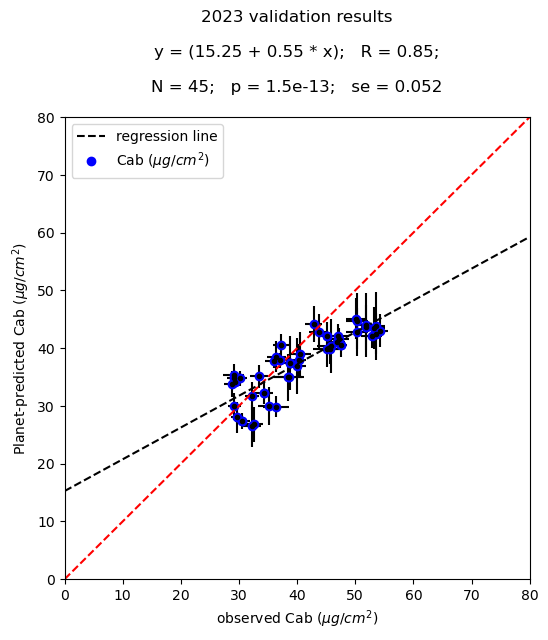

In [20]:
# plot limit
m = 80

mean_pred = np.array([np.mean(d,axis=1) for d in all_target_s2_pred])
mean_obs = np.mean(all_data,axis=0)
std_pred = np.array([np.std(d,axis=1) for d in all_target_s2_pred])
std_obs = np.std(all_data,axis=0)

plt.figure(figsize=(6,6))
plt.errorbar(mean_obs.ravel(),mean_pred.ravel(),std_obs.ravel(),std_pred.ravel(),'k.')
plt.plot(mean_obs,mean_pred,'bo')

plt.plot([0.,m],[0.,m],'r--')
plt.xlabel('observed Cab ($\mu g/cm^2$)')
plt.ylabel('Planet-predicted Cab ($\mu g/cm^2$)')

plt.xlim(0,m)
plt.ylim(0,m)

from scipy.stats import linregress
slope, intercept, r, p, se = linregress(mean_obs.ravel(),mean_pred.ravel())

plt.title(f'2023 validation results\n\ny = ({intercept:.2f} + {slope:.2} * x);   R = {r:.2};\n\nN = 45;   p = {p:.2};   se = {se:.2}\n')
plt.plot([0.,m],[intercept,intercept+slope*m],'k--',\
         label=f'regression line')

plt.plot(mean_obs[0],mean_pred[0],'bo',label='Cab ($\mu g/cm^2$)')

_=plt.legend()

The validation for 2023 indicates a bias of around 15 $\mu g/cm^2$ in the Planet predictions with a slope around 0.55, with a correlation around 0.85.

## Summary

In summary, we have perfomed a comparison of field-measured LAI and Cab over a rain-fed wheat field with estimsates of those biophysical parameters obtained from the ARC method. Observations were taken at 9 times over the season in 2023. There is a large number of satellite observations that cover the field from cloud-free Planet data.

The approach is able to find a solution for ensemble estimates of reflectance in 5 Planet wavebands, and make consistent spatial and temporal estimates of LAI and Cab (and other biophysical variables, see Feng et al., 2024). When compared to field observations, the Planet ARC estimates appear to cover the same temporal pattern as the ground observations. There is a strong linear relationship between the Planet-predicted and observed LAI and Cab, but there is a bias in the estimates of LAI and Cab. The LAI has a small bias and a slope of around 1.2. For Cab, there is a bias of around 15 $\mu g/cm^2$ in the Planet estimates.

All of the data and codes for users running their own experiments along the same lines as this are provided in this notebook. There is a similar mortebook and dataset for data from an irrigated wheat field measured in 2022.